In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from shapely.geometry import Point

In [7]:
#combine dfs into one 

df = pd.DataFrame()
path_to_data = "../GSVData/Dataframes"
for csv in os.listdir(path_to_data):
    if df.empty:
        df = pd.read_csv(os.path.join(path_to_data, csv))
    else:
        temp = pd.read_csv(os.path.join(path_to_data, csv))
        df = pd.concat([df, temp])

In [8]:
display(df[(df.place_id==771)&(df.city_id=="Madrid") ])

,place_id,year,month,northdeg,city_id,lat,lon,panoid
1253,771,2008,8,262,Madrid,40.407490,-3.697518,a64thKk0xgJTzWo-5uuAjw
1853,771,2015,6,252,Madrid,40.407494,-3.697505,OguOFwOe2eZE_dJTfCudvg
2538,771,2014,3,261,Madrid,40.407479,-3.697564,CiWL9FswdQzITltIS412xg
5037,771,2018,8,264,Madrid,40.407494,-3.697507,02Wli1dXu0hKu8DBC64WvA
8810,771,2019,8,251,Madrid,40.407488,-3.697532,gTGkQDikNhQYGVBFH2_Jzw
9381,771,2011,4,259,Madrid,40.407488,-3.697530,SIHv5mKgq7dNkmZrFRqp9Q
10769,771,2016,5,263,Madrid,40.407484,-3.697550,Vf9AouQXUn036M4JR8F2Sw
11057,771,2012,5,258,Madrid,40.407495,-3.697500,kvOha0eOLZngv-WOJ3uRvg
12371,771,2017,9,253,Madrid,40.407495,-3.697501,vmCIERUojmghoj1H2HaUPw
12770,771,2013,10,256,Madrid,40.407496,-3.697500,cZkAX908o5S6xb29BsqoVw


In [9]:
# num of cities 
len(df['city_id'].unique())

23

In [23]:
df

,place_id,year,month,northdeg,city_id,lat,lon,panoid,picture_count,marker_size
0,1746,2014,2,140,Madrid,40.424332,-3.708372,oWCkDzuaXRAzU2HpwHRxpA,14553,151.53
1,1667,2011,4,278,Madrid,40.422298,-3.671313,Fe3LcKMItNG8Iq6ybpIH-A,14553,151.53
2,1937,2014,4,25,Madrid,40.427228,-3.691281,moHqqGVRoB9hb0L4qZ-FuA,14553,151.53
3,2127,2011,4,328,Madrid,40.430231,-3.675223,UbAd6zgFnw8lCfiyevQW4g,14553,151.53
4,2109,2018,7,347,Madrid,40.430127,-3.691862,iCCwr7uBgLpQIe63YbvmsA,14553,151.53
...,...,...,...,...,...,...,...,...,...,...
529496,3151,2017,9,530,PRS,48.867335,2.303481,rbaOu9XYm5qZuLMNNT4HaQ,39963,405.63
529497,2690,2015,6,308,PRS,48.857356,2.335159,ZYyWY2wsGXBt7TXvoZoYHg,39963,405.63
529498,1330,2015,7,320,PRS,48.827218,2.209339,LWrQmQ9m683YeTv7BfOlFw,39963,405.63
529499,771,2018,6,470,PRS,48.813550,2.439482,YOkya2fpgNwIqOQFH2NTQA,39963,405.63


/Users/danielskahill/Documents/MIDS/207/city-photo-deep-learning


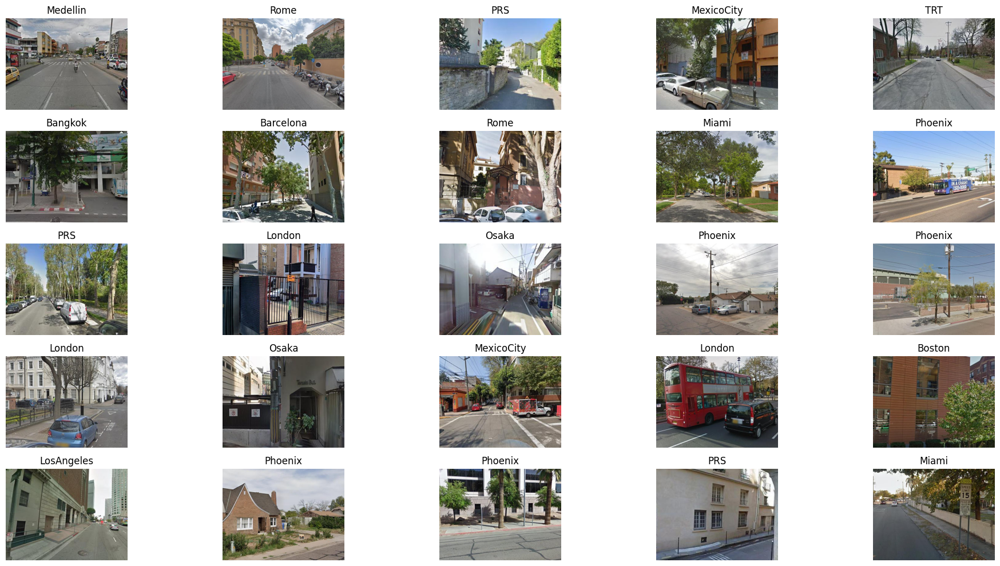

In [48]:
sample = df.sample(25)

fig, axes = plt.subplots(5, 5, figsize=(20, 10))
imgs = []
cities = []
for idx, img in sample.iterrows():
    path = img['city_id'] + '_' + str(img['place_id']).zfill(7) + '_' + str(img['year']) \
    + '_' + str(img['month']).zfill(2) + '_' + str(img['northdeg']).zfill(3) + '_' + str(img['lat']) + '_' \
    + str(img['lon']) + '_' + img['panoid'] + '.jpg'
    path = os.path.join("../GSVData", "Images", img['city_id'], path)
    imgs.append(path)
    cities.append(img['city_id'])
    
for i, ax in enumerate(axes.flat):
    img_ = plt.imread(imgs[i])
    ax.imshow(img_)
    ax.axis('off')
    ax.set_title(cities[i])

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Distribution of Images')

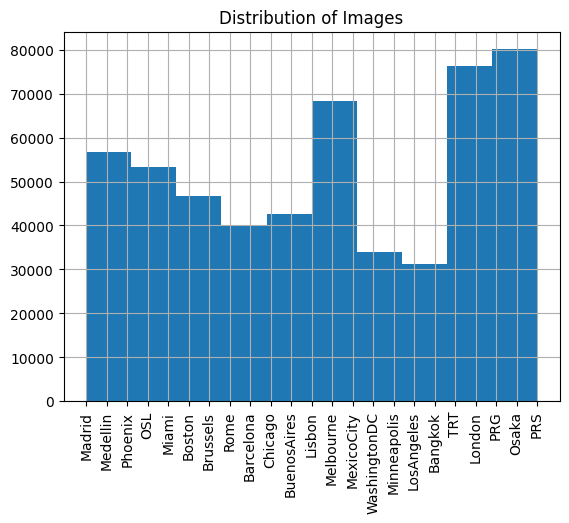

In [10]:
#img distribution 

df['city_id'].hist()
plt.xticks(rotation=90)
plt.title("Distribution of Images")
#plt.show()

Text(0.5, 1.0, 'Distribution of Photo Year')

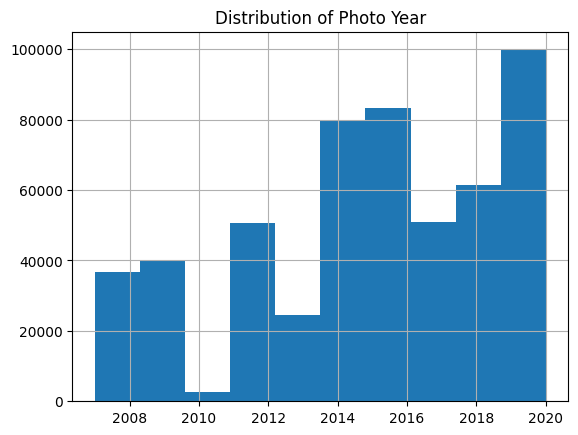

In [12]:
df = df[df['year'] > 1970]
df = df[df['year'] != 2021]

df['year'].hist()
plt.title("Distribution of Photo Year")

In [13]:
#place id value counts
df['place_id'].value_counts()

697     203
319     197
507     187
145     187
547     185
       ... 
8647      4
8789      4
8563      4
9110      4
8787      4
Name: place_id, Length: 9099, dtype: int64

In [14]:
bstn = df[df['city_id'] == 'Boston']

In [15]:
import plotly.express as px

fig = px.scatter_mapbox(bstn,
                       lat='lat',
                       lon='lon',
                       zoom=12,
                       height=800,
                       width=800)

fig.update_layout(mapbox_style='open-street-map')
fig.show()

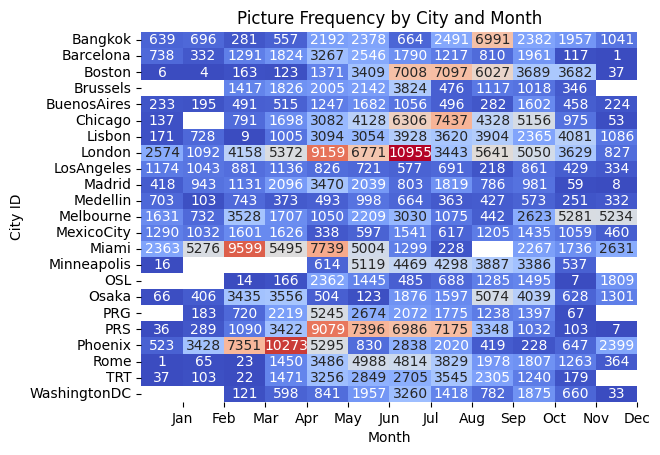

In [17]:
import seaborn as sns
pivot_df = df.groupby(['city_id', 'month'])['panoid'].count().reset_index()

pivot_df = pivot_df.pivot(index='city_id', columns='month', values='panoid')

sns.heatmap(pivot_df, cmap='coolwarm', annot=True, fmt='.0f', cbar=False)

plt.title('Picture Frequency by City and Month')
plt.xlabel('Month')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.ylabel('City ID')

plt.show()

In [18]:
import pandas as pd
import plotly.express as px

city_counts = df.groupby('city_id')['panoid'].count().reset_index()
city_counts.columns = ['city_id', 'picture_count']

df = pd.merge(df, city_counts, on='city_id')

df['marker_size'] = df['picture_count'].apply(lambda x: 6 + x/100)

fig = px.scatter_mapbox(df.sample(2000),
                        lat='lat',
                        lon='lon',
                        zoom=1,
                        height=800,
                        width=800,
                        size='marker_size',
                        color='picture_count')

fig.update_layout(mapbox_style='open-street-map')
fig.show()

/var/folders/fz/sjq4sqnj4z1fcnsyxrf6tkkc0000gq/T/ipykernel_75241/1438070333.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



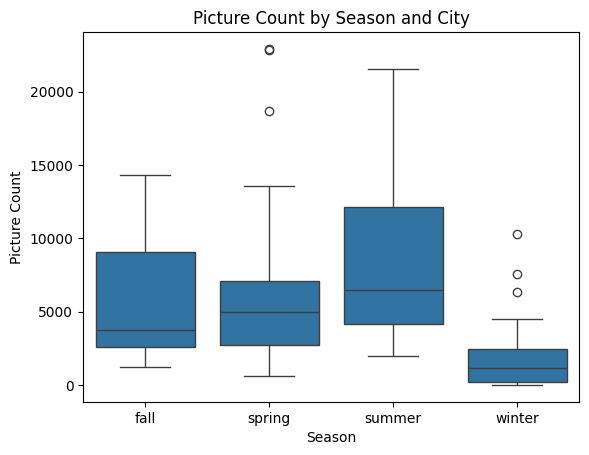

In [21]:
df['season'] = pd.cut(df['month'], [0, 2, 5, 8, 11, 12], labels=['winter', 'spring', 'summer', 'fall', 'winter'], ordered=False)
city_season_counts = df.groupby(['city_id', 'season'])['panoid'].count().reset_index()

sns.boxplot(data=city_season_counts, x='season', y='panoid')

plt.title('Picture Count by Season and City')
plt.xlabel('Season')
plt.ylabel('Picture Count')

plt.show()

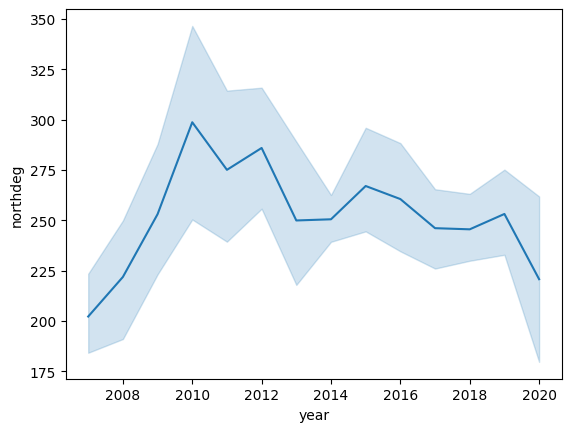

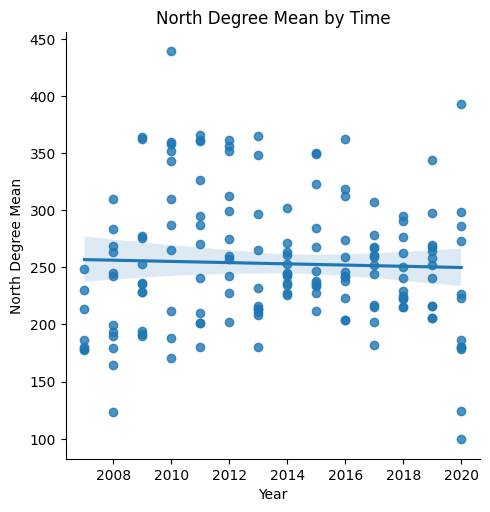

In [23]:
northdeg_means = df.groupby(['year', 'month'])['northdeg'].mean().reset_index()

sns.lineplot(data=northdeg_means, x='year', y='northdeg')

sns.lmplot(data=northdeg_means, x='year', y='northdeg')

plt.title('North Degree Mean by Time')
plt.xlabel('Year')
plt.ylabel('North Degree Mean')

# Show the plot
plt.show()

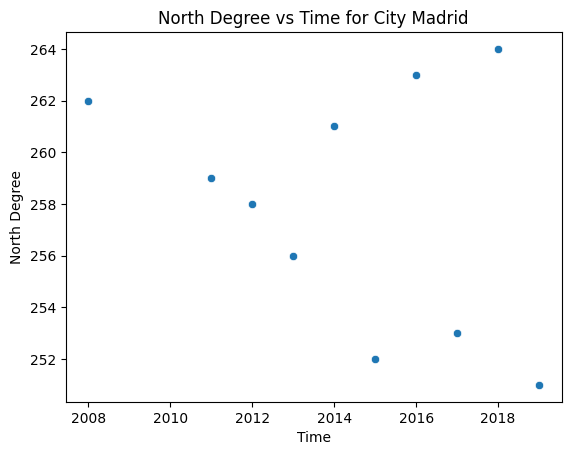

In [36]:
city_id = "Madrid"
city_data = df[(df.place_id==771)&(df.city_id=="Madrid")]

sns.scatterplot(data=city_data, x='year', y='northdeg')

plt.title(f'North Degree vs Time for City {city_id}')
plt.xlabel('Time')
plt.ylabel('North Degree')

# Show the plot
plt.show()

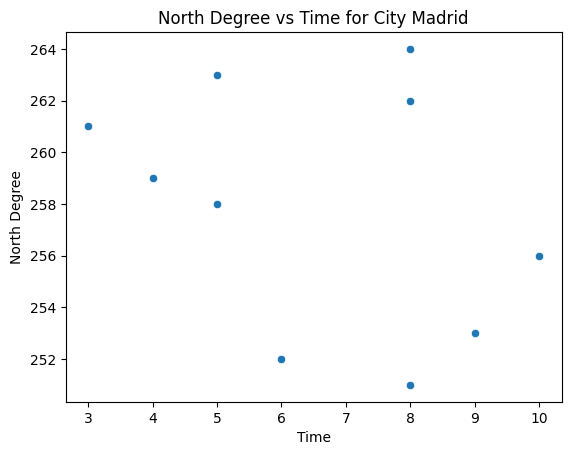

In [37]:
city_data = df[(df.place_id==771)&(df.city_id=="Madrid")]

sns.scatterplot(data=city_data, x='month', y='northdeg')

plt.title(f'North Degree vs Time for City Madrid')
plt.xlabel('Time')
plt.ylabel('North Degree')

plt.show()